# Clasificador de Imágenes

## Importar librerías

In [30]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.callbacks import TensorBoard

import numpy as np

import matplotlib.pyplot as plt
import cv2

## Cargar el dataset

In [3]:
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incomplete8CIV5L/cats_vs_dogs-train.tfrecord


  0%|          | 0/23262 [00:00<?, ? examples/s]

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


## Conocer los datos

In [4]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=4.0.0,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA that Exploits Interest-Aligned Manual Image Categorization},
    booktitle = {Proceedings of 14th ACM Conference on Computer and Communications Security (CCS)},
    ye

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

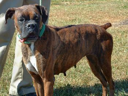
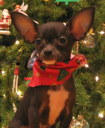
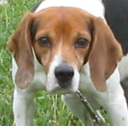
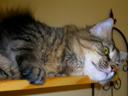
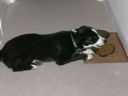

In [5]:
tfds.as_dataframe(datos['train'].take(5), metadatos)

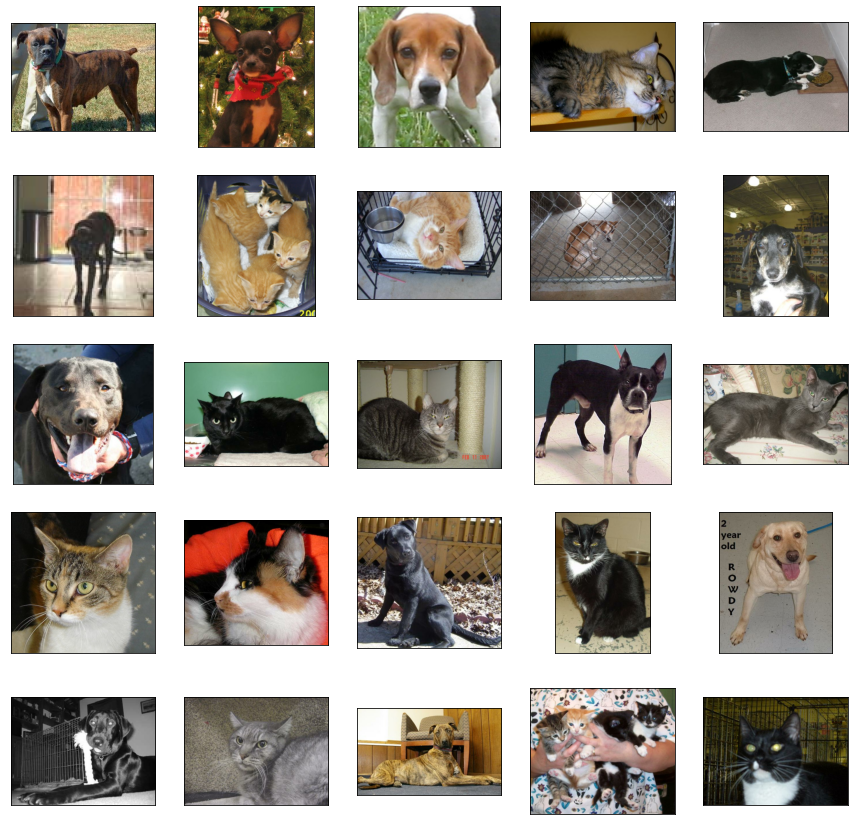

In [8]:
plt.figure(figsize=(15, 15))

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen)

## Manipular los datos

Podemos reconfigurar el tamaño de las imágenes por medio de la librería CV2.

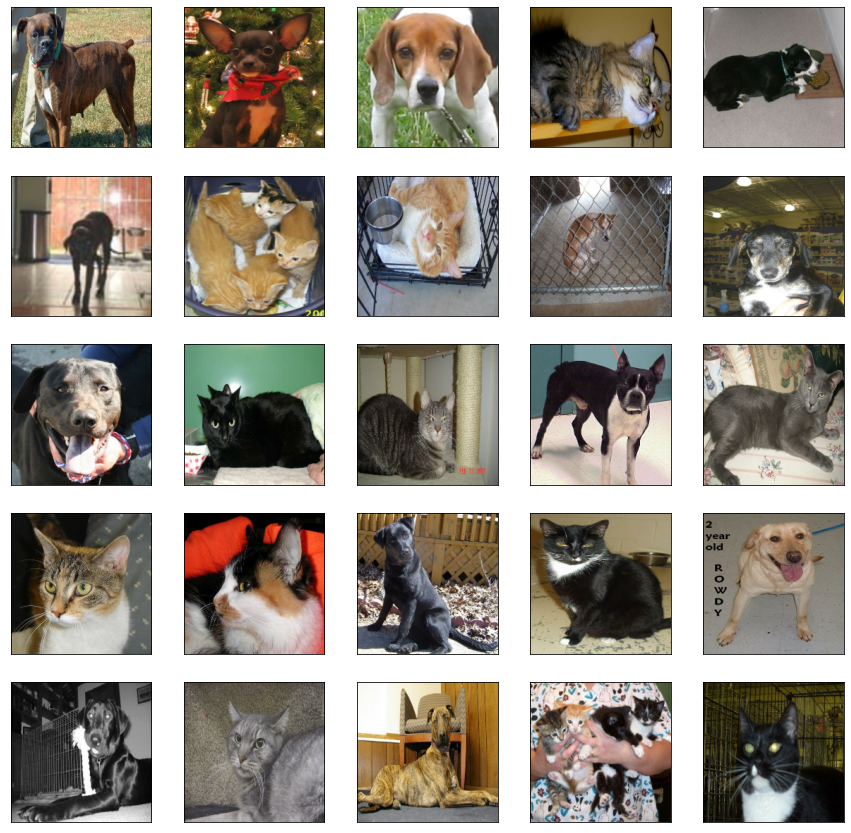

In [10]:
plt.figure(figsize=(15, 15))

size = 200

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
    imagen = cv2.resize(imagen.numpy(), (size, size))
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen)

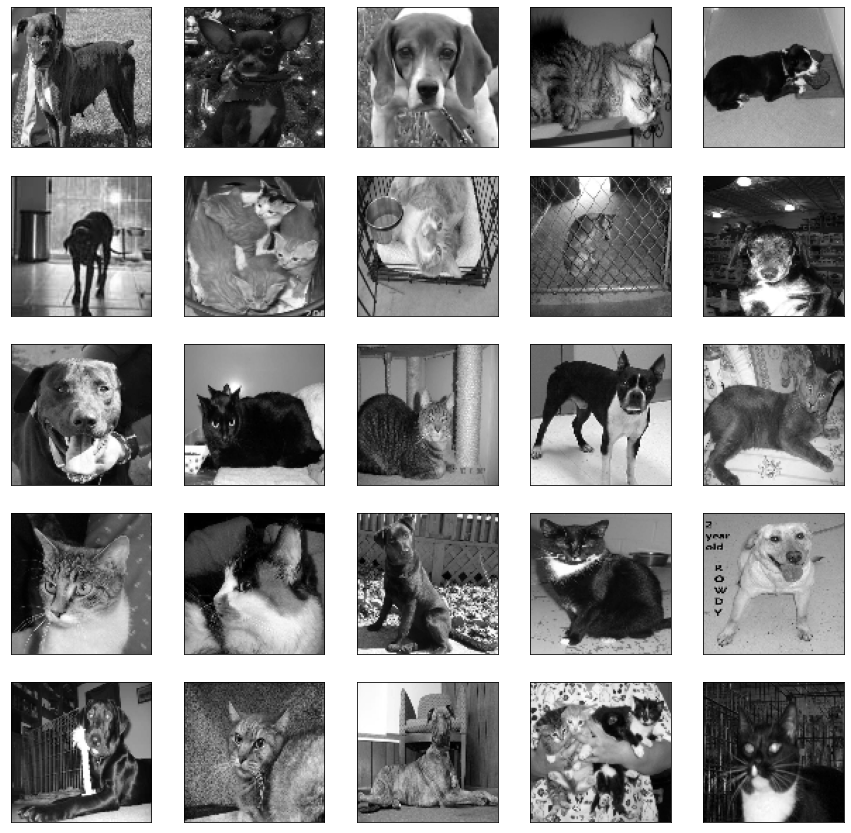

In [16]:
plt.figure(figsize=(15, 15))

size = 100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
    imagen = cv2.resize(imagen.numpy(), (size, size))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen, cmap='gray')

In [17]:
train_data = []

size = 100

for i, (imagen, etiqueta) in enumerate(datos['train']):
    imagen=cv2.resize(imagen.numpy(), (size, size))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    imagen = imagen.reshape(size, size, 1)
    train_data.append([imagen, etiqueta])

In [18]:
len(train_data)

23262

## Separar los datos

In [19]:
x = []
y = []

for imagen, etiqueta in train_data:
    x.append(imagen)
    y.append(etiqueta)

In [21]:
x = np.array(x).astype('float') / 225

In [23]:
x

array([[[[1.07555556],
         [0.84444444],
         [0.46666667],
         ...,
         [0.84      ],
         [0.86666667],
         [0.63555556]],

        [[1.02222222],
         [0.57777778],
         [0.39111111],
         ...,
         [0.83555556],
         [0.79555556],
         [0.83111111]],

        [[0.75555556],
         [0.41333333],
         [0.37333333],
         ...,
         [0.58222222],
         [0.70222222],
         [0.74666667]],

        ...,

        [[0.49777778],
         [0.76888889],
         [0.72888889],
         ...,
         [0.62666667],
         [0.67555556],
         [0.52888889]],

        [[0.62222222],
         [0.67111111],
         [0.76444444],
         ...,
         [0.42666667],
         [0.66666667],
         [0.67555556]],

        [[0.40888889],
         [0.49777778],
         [0.74666667],
         ...,
         [0.19555556],
         [0.23111111],
         [0.20888889]]],


       [[[0.64888889],
         [0.51111111],
         [0.40

In [22]:
y = np.array(y)

In [24]:
y

array([1, 1, 1, ..., 0, 1, 0])

## Crear modelo

In [27]:
modelo_denso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

In [29]:
modelo_denso.compile(tf.keras.optimizers.Adam(0.01), loss='binary_crossentropy', metrics=['accuracy'])

## Entrenar el modelo

In [31]:
tensorboard_denso = TensorBoard(log_dir='logs/denso')
entrenado = modelo_denso.fit(x, y, validation_split=0.15, epochs=100, callbacks=[tensorboard_denso])

Epoch 1/100
618/618 [==============================] - 7s 6ms/step - loss: 1.0510 - accuracy: 0.5062 - val_loss: 0.6934 - val_accuracy: 0.5000
Epoch 2/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6934 - accuracy: 0.5053 - val_loss: 0.6934 - val_accuracy: 0.5000
Epoch 3/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6936 - accuracy: 0.4905 - val_loss: 0.6932 - val_accuracy: 0.4997
Epoch 4/100
618/618 [==============================] - 3s 5ms/step - loss: 0.7020 - accuracy: 0.5004 - val_loss: 0.6932 - val_accuracy: 0.4997
Epoch 5/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6935 - accuracy: 0.4976 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 6/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6935 - accuracy: 0.4985 - val_loss: 0.6938 - val_accuracy: 0.4997
Epoch 7/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6933 - accuracy: 0.5034 - val_loss: 0.6935 - val_accuracy: 0.4997

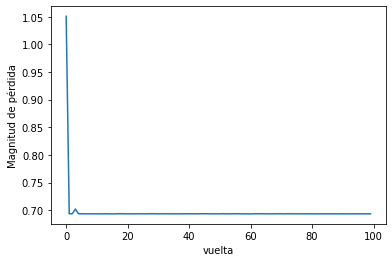

In [32]:
plt.xlabel('vuelta')
plt.ylabel('Magnitud de pérdida')
plt.plot(entrenado.history['loss'])

In [33]:
%load_ext tensorboard

In [34]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>